## Exploratory analysis based on astronauts dataset and their missions dataset

All the conclusions and insights are written above the cells.
<br>

### Importing libs

In [724]:
import pandas as pd
import numpy as np

from pandas_profiling import ProfileReport

import ppscore as pps

import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px

from datetime import datetime

In [3]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 100)
pd.options.display.float_format = '{:.5f}'.format

### Importing Data

In [130]:
df_astronauts = pd.read_csv('Archive/astronauts.csv')

In [5]:
df_astronauts.head()

,Unnamed: 0,id,number,nationwide_number,name,original_name,sex,year_of_birth,nationality,military_civilian,selection,year_of_selection,mission_number,total_number_of_missions,occupation,year_of_mission,mission_title,ascend_shuttle,in_orbit,descend_shuttle,hours_mission,total_hrs_sum,field21,eva_hrs_mission,total_eva_hrs
0,0,1,1,1,"Gagarin, Yuri",ГАГАРИН Юрий Алексеевич,male,1934,U.S.S.R/Russia,military,TsPK-1,1960,1,1,pilot,1961,Vostok 1,Vostok 1,Vostok 2,Vostok 3,1.77000,1.77000,0,0.00000,0.00000
1,1,2,2,2,"Titov, Gherman",ТИТОВ Герман Степанович,male,1935,U.S.S.R/Russia,military,TsPK-1,1960,1,1,pilot,1961,Vostok 2,Vostok 2,Vostok 2,Vostok 2,25.00000,25.30000,0,0.00000,0.00000
2,2,3,3,1,"Glenn, John H., Jr.","Glenn, John H., Jr.",male,1921,U.S.,military,NASA Astronaut Group 1,1959,1,2,pilot,1962,MA-6,MA-6,MA-6,MA-6,5.00000,218.00000,0,0.00000,0.00000
3,3,4,3,1,"Glenn, John H., Jr.","Glenn, John H., Jr.",male,1921,U.S.,military,NASA Astronaut Group 2,1959,2,2,PSP,1998,STS-95,STS-95,STS-95,STS-95,213.00000,218.00000,0,0.00000,0.00000
4,4,5,4,2,"Carpenter, M. Scott","Carpenter, M. Scott",male,1925,U.S.,military,NASA- 1,1959,1,1,Pilot,1962,Mercury-Atlas 7,Mercury-Atlas 7,Mercury-Atlas 7,Mercury-Atlas 7,5.00000,5.00000,0,0.00000,0.00000


In [534]:
df_missions = pd.read_csv('Archive/missions.csv')

In [7]:
df_missions.head()

,Unnamed: 0,ID,Company Name,Location,Date,Detail,Status Rocket,Cost,Status Mission
0,0,0,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA","Fri Aug 07, 2020 05:12 UTC",Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,StatusActive,50.0,Success
1,1,1,CASC,"Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...","Thu Aug 06, 2020 04:01 UTC",Long March 2D | Gaofen-9 04 & Q-SAT,StatusActive,29.75,Success
2,2,2,SpaceX,"Pad A, Boca Chica, Texas, USA","Tue Aug 04, 2020 23:57 UTC",Starship Prototype | 150 Meter Hop,StatusActive,NaN,Success
3,3,3,Roscosmos,"Site 200/39, Baikonur Cosmodrome, Kazakhstan","Thu Jul 30, 2020 21:25 UTC",Proton-M/Briz-M | Ekspress-80 & Ekspress-103,StatusActive,65.0,Success
4,4,4,ULA,"SLC-41, Cape Canaveral AFS, Florida, USA","Thu Jul 30, 2020 11:50 UTC",Atlas V 541 | Perseverance,StatusActive,145.0,Success


- Is possible to join both datasets? (Tryied to find if mission_title from astronauts dataset into the detail column in missions dataset)

### Profilling and first impressions

In [18]:
df_astronauts.describe()

,Unnamed: 0,id,number,nationwide_number,year_of_birth,year_of_selection,mission_number,total_number_of_missions,year_of_mission,hours_mission,total_hrs_sum,field21,eva_hrs_mission,total_eva_hrs
count,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000
mean,638.00000,639.00000,274.23336,128.75411,1951.68363,1985.58888,1.99217,2.98277,1994.59749,1050.88398,2968.34141,0.62882,3.66129,10.76141
std,368.78246,368.78246,148.18539,97.26359,11.43512,12.21917,1.14536,1.40074,12.58324,1714.79196,4214.71510,1.16575,7.28724,16.04525
min,0.00000,1.00000,1.00000,1.00000,1921.00000,1959.00000,1.00000,1.00000,1961.00000,0.00000,0.61000,0.00000,0.00000,0.00000
25%,319.00000,320.00000,153.00000,47.00000,1944.00000,1978.00000,1.00000,2.00000,1986.00000,190.03000,482.00000,0.00000,0.00000,0.00000
50%,638.00000,639.00000,278.00000,110.00000,1952.00000,1987.00000,2.00000,3.00000,1995.00000,261.00000,932.00000,0.00000,0.00000,0.00000
75%,957.00000,958.00000,390.00000,204.00000,1959.00000,1995.00000,3.00000,4.00000,2003.00000,382.00000,4264.00000,1.00000,4.72000,19.52000
max,1276.00000,1277.00000,565.00000,433.00000,1983.00000,2018.00000,7.00000,7.00000,2019.00000,10505.00000,21083.52000,7.00000,89.13000,78.80000


In [9]:
profile_astronauts = ProfileReport(df_astronauts, explorative=True)

In [10]:
profile_astronauts

#### First impressions of Astrounauts Dataset:

Great data quality in the dataset, no duplicate values and low percentage of missing values

In [19]:
df_missions.describe()

,Unnamed: 0,ID
count,4324.00000,4324.00000
mean,2161.50000,2161.50000
std,1248.37561,1248.37561
min,0.00000,0.00000
25%,1080.75000,1080.75000
50%,2161.50000,2161.50000
75%,3242.25000,3242.25000
max,4323.00000,4323.00000


In [11]:
profile_missions = ProfileReport(df_missions, explorative=True)

In [12]:
profile_missions

#### First impressions of Missions Dataset:

High number of missing values (77%) in column Cost, no duplicated values and most of the variables are categorical

### Data Analysis

#### df_astronauts

##### Data Prep

In [132]:
df_astronauts.head()

,Unnamed: 0,id,number,nationwide_number,name,original_name,sex,year_of_birth,nationality,military_civilian,selection,year_of_selection,mission_number,total_number_of_missions,occupation,year_of_mission,mission_title,ascend_shuttle,in_orbit,descend_shuttle,hours_mission,total_hrs_sum,field21,eva_hrs_mission,total_eva_hrs
0,0,1,1,1,"Gagarin, Yuri",ГАГАРИН Юрий Алексеевич,male,1934,U.S.S.R/Russia,military,TsPK-1,1960,1,1,pilot,1961,Vostok 1,Vostok 1,Vostok 2,Vostok 3,1.77000,1.77000,0,0.00000,0.00000
1,1,2,2,2,"Titov, Gherman",ТИТОВ Герман Степанович,male,1935,U.S.S.R/Russia,military,TsPK-1,1960,1,1,pilot,1961,Vostok 2,Vostok 2,Vostok 2,Vostok 2,25.00000,25.30000,0,0.00000,0.00000
2,2,3,3,1,"Glenn, John H., Jr.","Glenn, John H., Jr.",male,1921,U.S.,military,NASA Astronaut Group 1,1959,1,2,pilot,1962,MA-6,MA-6,MA-6,MA-6,5.00000,218.00000,0,0.00000,0.00000
3,3,4,3,1,"Glenn, John H., Jr.","Glenn, John H., Jr.",male,1921,U.S.,military,NASA Astronaut Group 2,1959,2,2,PSP,1998,STS-95,STS-95,STS-95,STS-95,213.00000,218.00000,0,0.00000,0.00000
4,4,5,4,2,"Carpenter, M. Scott","Carpenter, M. Scott",male,1925,U.S.,military,NASA- 1,1959,1,1,Pilot,1962,Mercury-Atlas 7,Mercury-Atlas 7,Mercury-Atlas 7,Mercury-Atlas 7,5.00000,5.00000,0,0.00000,0.00000


In [259]:
for index, row in df_astronauts.iterrows():
    
    df_astronauts.at[index, 'time_between_selection_mission'] = row['year_of_mission'] - row['year_of_selection']
    
    df_astronauts.at[index, 'age_at_mission'] = row['year_of_mission'] - row['year_of_birth']
    
    df_astronauts.at[index, 'age_at_selection'] = row['year_of_selection'] - row['year_of_birth']

In [260]:
df_astronauts.head()

,Unnamed: 0,id,number,nationwide_number,name,original_name,sex,year_of_birth,nationality,military_civilian,selection,year_of_selection,mission_number,total_number_of_missions,occupation,year_of_mission,mission_title,ascend_shuttle,in_orbit,descend_shuttle,hours_mission,total_hrs_sum,field21,eva_hrs_mission,total_eva_hrs,age,time_between_selection_mission,age_at_mission,age_at_selection
0,0,1,1,1,"Gagarin, Yuri",ГАГАРИН Юрий Алексеевич,male,1934,U.S.S.R/Russia,military,TsPK-1,1960,1,1,pilot,1961,Vostok 1,Vostok 1,Vostok 2,Vostok 3,1.77000,1.77000,0,0.00000,0.00000,86,1,27.00000,26.00000
1,1,2,2,2,"Titov, Gherman",ТИТОВ Герман Степанович,male,1935,U.S.S.R/Russia,military,TsPK-1,1960,1,1,pilot,1961,Vostok 2,Vostok 2,Vostok 2,Vostok 2,25.00000,25.30000,0,0.00000,0.00000,85,1,26.00000,25.00000
2,2,3,3,1,"Glenn, John H., Jr.","Glenn, John H., Jr.",male,1921,U.S.,military,NASA Astronaut Group 1,1959,1,2,pilot,1962,MA-6,MA-6,MA-6,MA-6,5.00000,218.00000,0,0.00000,0.00000,99,3,41.00000,38.00000
3,3,4,3,1,"Glenn, John H., Jr.","Glenn, John H., Jr.",male,1921,U.S.,military,NASA Astronaut Group 2,1959,2,2,psp,1998,STS-95,STS-95,STS-95,STS-95,213.00000,218.00000,0,0.00000,0.00000,99,39,77.00000,38.00000
4,4,5,4,2,"Carpenter, M. Scott","Carpenter, M. Scott",male,1925,U.S.,military,NASA- 1,1959,1,1,pilot,1962,Mercury-Atlas 7,Mercury-Atlas 7,Mercury-Atlas 7,Mercury-Atlas 7,5.00000,5.00000,0,0.00000,0.00000,95,3,37.00000,34.00000


In [251]:
df_astronauts['occupation'].drop_duplicates()

0                         pilot
3                           PSP
4                         Pilot
8                     commander
20                          MSP
65              flight engineer
543          Other (Journalist)
741             Flight engineer
998       Other (space tourist)
1027      Other (Space tourist)
1066              Space tourist
1276    spaceflight participant
Name: occupation, dtype: object

In [253]:
df_astronauts['occupation'] = df_astronauts['occupation'].apply(lambda x: x.lower())

In [255]:
df_astronauts['occupation'] = df_astronauts['occupation'].apply(lambda x: x.replace('other (space tourist)', 'space tourist'))

In [256]:
df_astronauts['occupation'].drop_duplicates()

0                         pilot
3                           psp
8                     commander
20                          msp
65              flight engineer
543          other (journalist)
998               space tourist
1276    spaceflight participant
Name: occupation, dtype: object

In [265]:
df_astronauts.describe()

,Unnamed: 0,id,number,nationwide_number,year_of_birth,year_of_selection,mission_number,total_number_of_missions,year_of_mission,hours_mission,total_hrs_sum,field21,eva_hrs_mission,total_eva_hrs,age,time_between_selection_mission,age_at_mission,age_at_selection
count,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000,1277.00000
mean,638.00000,639.00000,274.23336,128.75411,1951.68363,1985.58888,1.99217,2.98277,1994.59749,1050.88398,2968.34141,0.62882,3.66129,10.76141,68.31637,9.00861,42.91386,33.90525
std,368.78246,368.78246,148.18539,97.26359,11.43512,12.21917,1.14536,1.40074,12.58324,1714.79196,4214.71510,1.16575,7.28724,16.04525,11.43512,5.13340,5.81955,4.58425
min,0.00000,1.00000,1.00000,1.00000,1921.00000,1959.00000,1.00000,1.00000,1961.00000,0.00000,0.61000,0.00000,0.00000,0.00000,37.00000,-9.00000,26.00000,23.00000
25%,319.00000,320.00000,153.00000,47.00000,1944.00000,1978.00000,1.00000,2.00000,1986.00000,190.03000,482.00000,0.00000,0.00000,0.00000,61.00000,5.00000,39.00000,31.00000
50%,638.00000,639.00000,278.00000,110.00000,1952.00000,1987.00000,2.00000,3.00000,1995.00000,261.00000,932.00000,0.00000,0.00000,0.00000,68.00000,8.00000,42.00000,34.00000
75%,957.00000,958.00000,390.00000,204.00000,1959.00000,1995.00000,3.00000,4.00000,2003.00000,382.00000,4264.00000,1.00000,4.72000,19.52000,76.00000,12.00000,47.00000,36.00000
max,1276.00000,1277.00000,565.00000,433.00000,1983.00000,2018.00000,7.00000,7.00000,2019.00000,10505.00000,21083.52000,7.00000,89.13000,78.80000,99.00000,39.00000,77.00000,60.00000


In [266]:
for index, row in df_astronauts.iterrows():
    
    if row['time_between_selection_mission'] <= 5:
    
        df_astronauts.at[index, 'time_between_selection_mission_category'] = 'Less or equal to 5'
        
    elif row['time_between_selection_mission'] > 5 and row['time_between_selection_mission'] <= 8:
    
        df_astronauts.at[index, 'time_between_selection_mission_category'] = 'Between 6 and 8'
        
    elif row['time_between_selection_mission'] > 8 and row['time_between_selection_mission'] <= 12:
    
        df_astronauts.at[index, 'time_between_selection_mission_category'] = 'Between 9 and 12'
        
    elif row['time_between_selection_mission'] > 12:
    
        df_astronauts.at[index, 'time_between_selection_mission_category'] = 'More than 12'

In [328]:
df_astronauts['nationality'].drop_duplicates()

0                 U.S.S.R/Russia
2                           U.S.
67                      Mongolia
72                       Romania
80                        France
185               Czechoslovakia
188                       Poland
189                      Germany
193                     Bulgaria
197                       Hungry
200                      Vietnam
201                         Cuba
285                        India
319                       Canada
368                 Saudi Arabia
402                   Netherland
415                       Mexico
437                        Syria
449                  Afghanistan
543                        Japan
570                         U.K.
587                      Austria
624                      Belgium
643                  Switzerland
647                        Italy
861                    Australia
913              U.S.S.R/Ukraine
947                        Spain
954                     Slovakia
1027    Republic of South Africa
1038      

##### Analysis

In [267]:
df_astronauts.head()

,Unnamed: 0,id,number,nationwide_number,name,original_name,sex,year_of_birth,nationality,military_civilian,selection,year_of_selection,mission_number,total_number_of_missions,occupation,year_of_mission,mission_title,ascend_shuttle,in_orbit,descend_shuttle,hours_mission,total_hrs_sum,field21,eva_hrs_mission,total_eva_hrs,age,time_between_selection_mission,age_at_mission,age_at_selection,time_between_selection_mission_category
0,0,1,1,1,"Gagarin, Yuri",ГАГАРИН Юрий Алексеевич,male,1934,U.S.S.R/Russia,military,TsPK-1,1960,1,1,pilot,1961,Vostok 1,Vostok 1,Vostok 2,Vostok 3,1.77000,1.77000,0,0.00000,0.00000,86,1,27.00000,26.00000,Less or equal to 5
1,1,2,2,2,"Titov, Gherman",ТИТОВ Герман Степанович,male,1935,U.S.S.R/Russia,military,TsPK-1,1960,1,1,pilot,1961,Vostok 2,Vostok 2,Vostok 2,Vostok 2,25.00000,25.30000,0,0.00000,0.00000,85,1,26.00000,25.00000,Less or equal to 5
2,2,3,3,1,"Glenn, John H., Jr.","Glenn, John H., Jr.",male,1921,U.S.,military,NASA Astronaut Group 1,1959,1,2,pilot,1962,MA-6,MA-6,MA-6,MA-6,5.00000,218.00000,0,0.00000,0.00000,99,3,41.00000,38.00000,Less or equal to 5
3,3,4,3,1,"Glenn, John H., Jr.","Glenn, John H., Jr.",male,1921,U.S.,military,NASA Astronaut Group 2,1959,2,2,psp,1998,STS-95,STS-95,STS-95,STS-95,213.00000,218.00000,0,0.00000,0.00000,99,39,77.00000,38.00000,More than 12
4,4,5,4,2,"Carpenter, M. Scott","Carpenter, M. Scott",male,1925,U.S.,military,NASA- 1,1959,1,1,pilot,1962,Mercury-Atlas 7,Mercury-Atlas 7,Mercury-Atlas 7,Mercury-Atlas 7,5.00000,5.00000,0,0.00000,0.00000,95,3,37.00000,34.00000,Less or equal to 5


PPScore: https://towardsdatascience.com/rip-correlation-introducing-the-predictive-power-score-3d90808b9598

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The 

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The 

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The 

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The 

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The 

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The 

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The 

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The least populated class in y has only %d"
/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=4.
  warnings.warn(("The 

<AxesSubplot:xlabel='x', ylabel='y'>

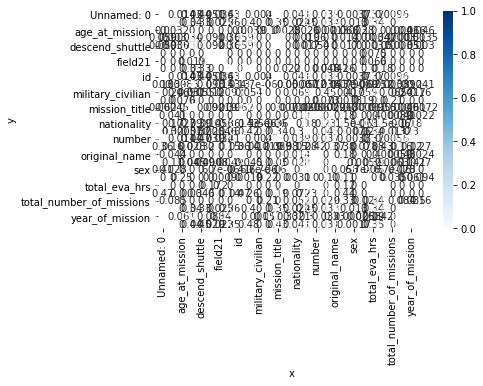

In [232]:
matrix_df = pps.matrix(df_astronauts)[['x', 'y', 'ppscore']].pivot(columns='x', index='y', values='ppscore')

<AxesSubplot:xlabel='x', ylabel='y'>

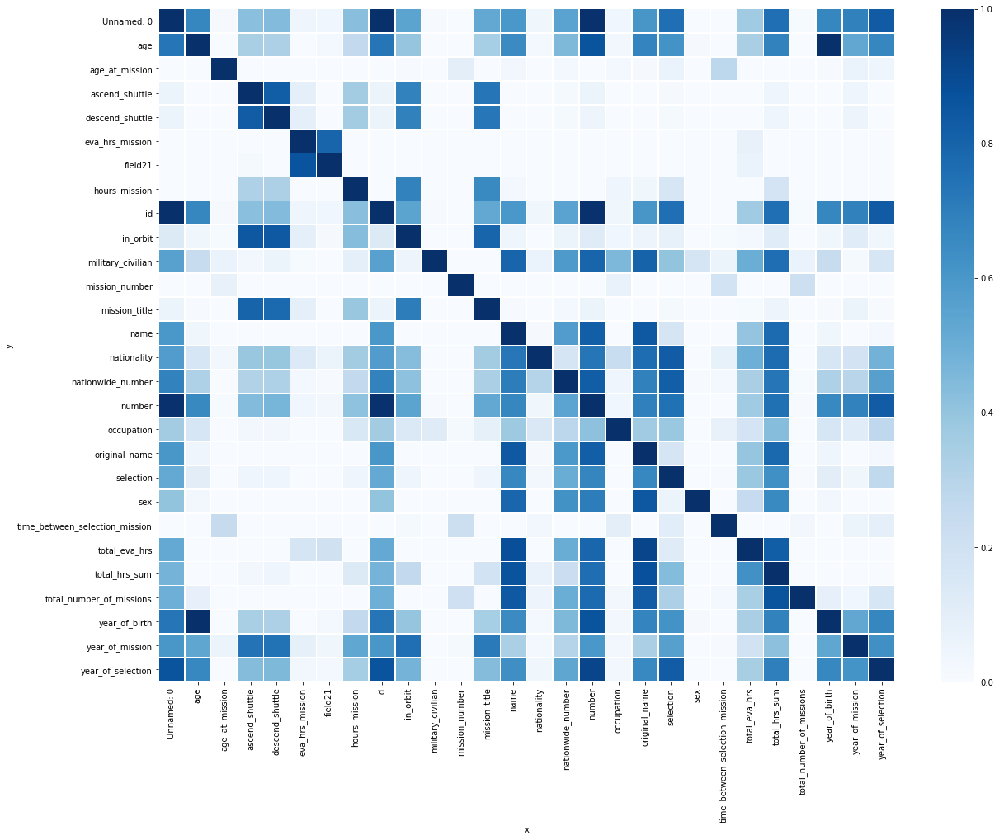

In [243]:
plt.subplots(figsize=(20,15))
sns.heatmap(matrix_df, vmin=0, vmax=1, cmap="Blues", linewidths=.5)

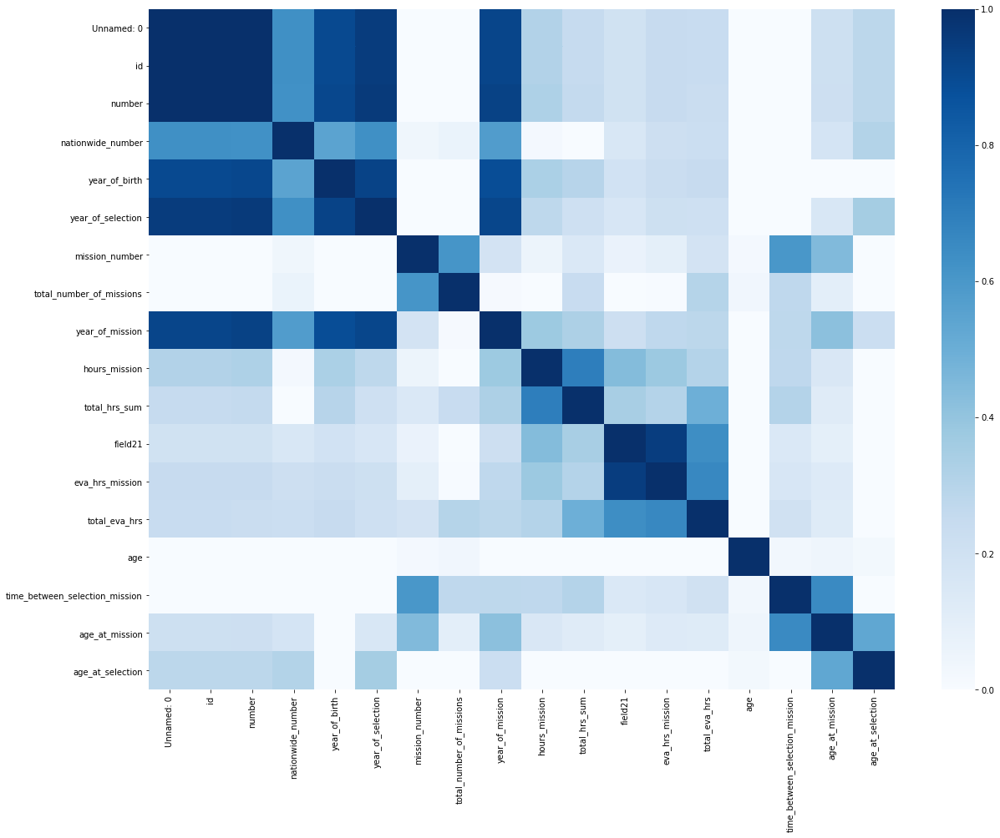

In [368]:
plt.subplots(figsize=(20,15))
sns.heatmap(df_astronauts.corr(), cmap="Blues", vmin=0);

Further analysis will be based on first impressions from PPScore and Correlation heatmap

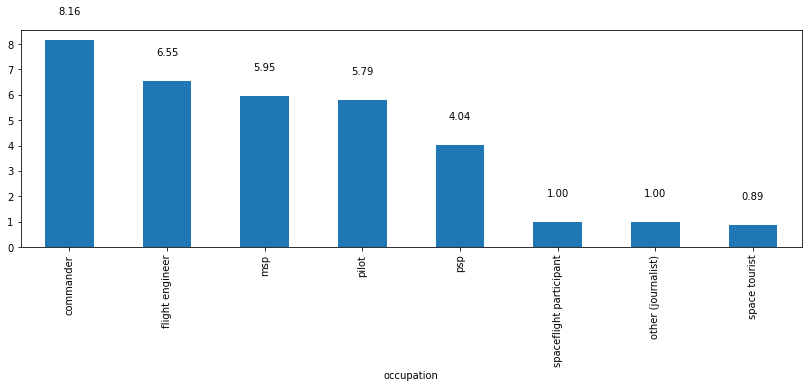

In [269]:
ax = df_astronauts[df_astronauts['mission_number'] == 1].groupby('occupation')['time_between_selection_mission'].mean().sort_values(ascending=False).plot(kind='bar',
                                                         figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

<AxesSubplot:title={'center':'time_between_selection_mission'}, xlabel='occupation'>

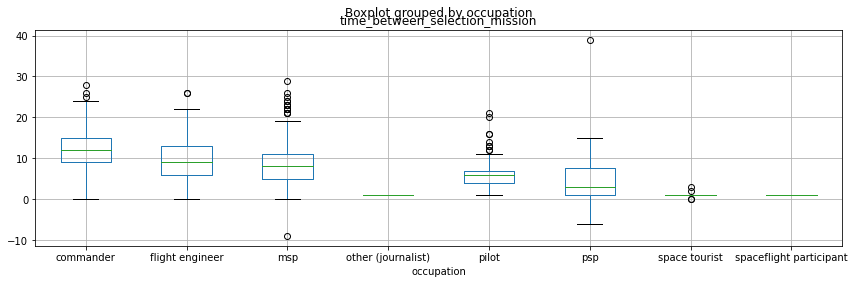

In [292]:
df_astronauts.boxplot(by='occupation', column=['time_between_selection_mission'], figsize=(14,4))

Due to the outliers in column "time_between_selection_mission", created a new column categorizing then based on quartiles 

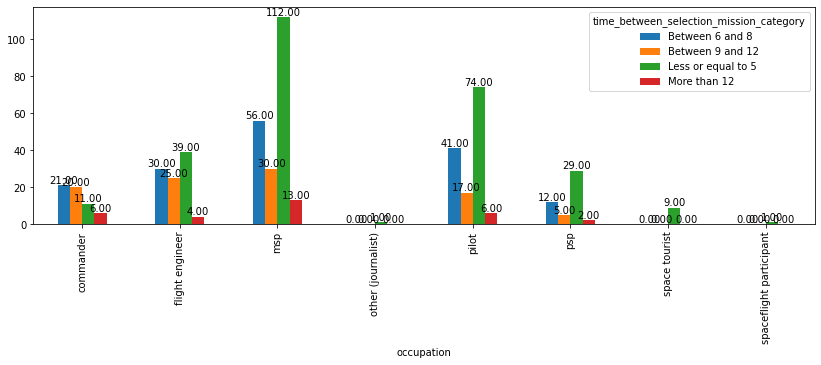

In [298]:
ax = df_astronauts[df_astronauts['mission_number'] == 1].groupby(['occupation', 'time_between_selection_mission_category'])['name'].nunique().unstack('time_between_selection_mission_category').plot(kind='bar', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

- Commanders take between 6 and 12 years to have their first mission, by the other side the pilots, msp, psp they are in mission with less than 5 years

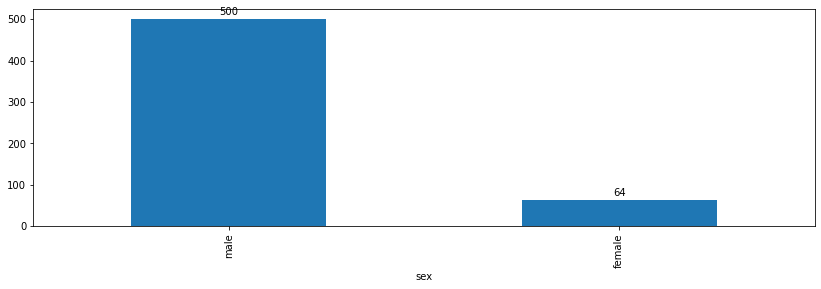

In [230]:
ax = df_astronauts.groupby('sex')['name'].nunique().sort_values(ascending=False).plot(kind='bar',
                                                         figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 10, height, ha='center')

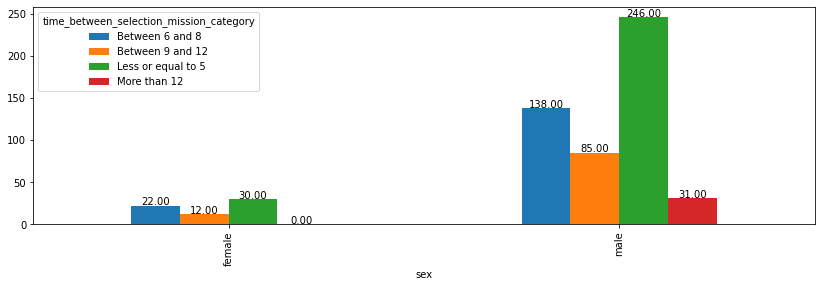

In [310]:
ax = df_astronauts[df_astronauts['mission_number'] == 1].groupby(['sex', 'time_between_selection_mission_category'])['name'].nunique().unstack('time_between_selection_mission_category').plot(kind='bar', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

- There are no difference in time between selection and mission based on sex

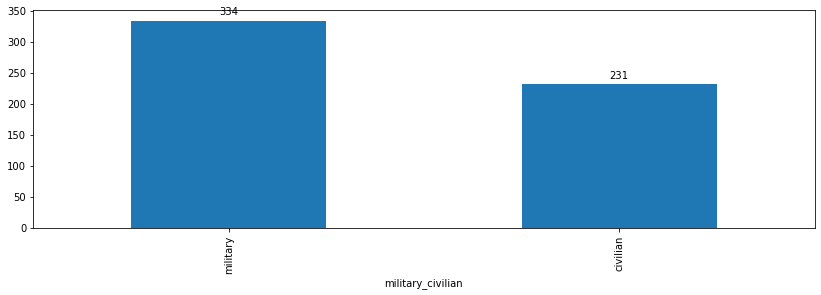

In [297]:
ax = df_astronauts.groupby('military_civilian')['name'].nunique().sort_values(ascending=False).plot(kind='bar',
                                                         figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 10, height, ha='center')

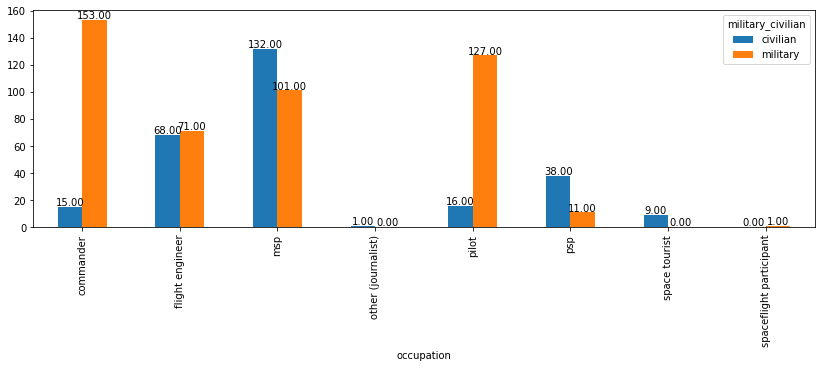

In [305]:
ax = df_astronauts.groupby(['occupation', 'military_civilian'])['name'].nunique().unstack('military_civilian').plot(kind='bar', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

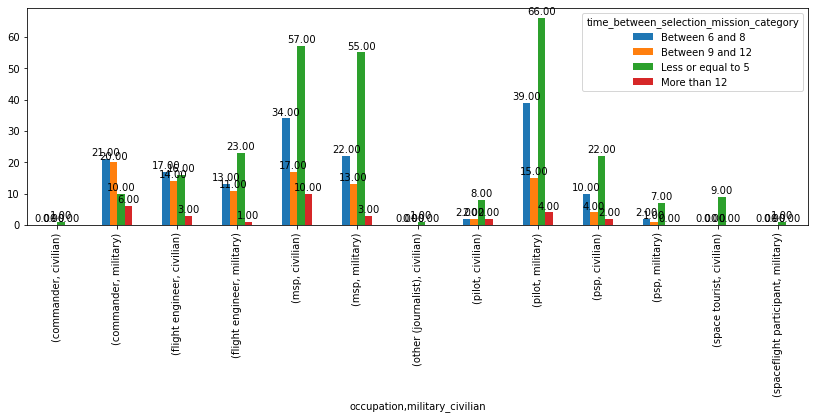

In [304]:
ax = df_astronauts[df_astronauts['mission_number'] == 1].groupby(['occupation', 'time_between_selection_mission_category', 'military_civilian'])['name'].nunique().unstack('time_between_selection_mission_category').plot(kind='bar', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

- There are no difference between the time from selection to first mission from millitary and civillian

<AxesSubplot:>

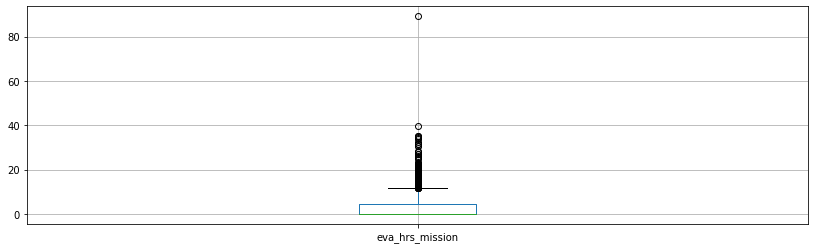

In [324]:
df_astronauts.boxplot(column=['eva_hrs_mission'], figsize=(14,4))

- Should use a Robust Scaler?

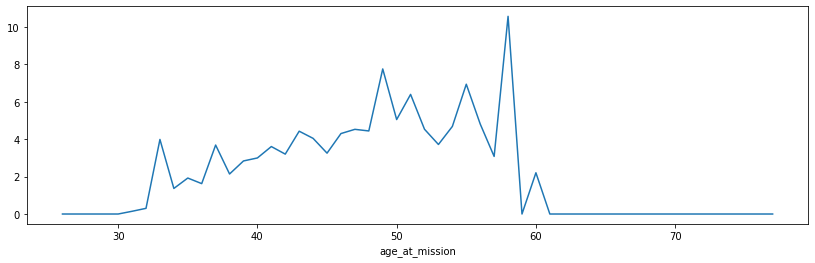

In [314]:
ax = df_astronauts.groupby(['age_at_mission'])['eva_hrs_mission'].mean().plot(kind='line', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

- According to the age the mean of EVA increases

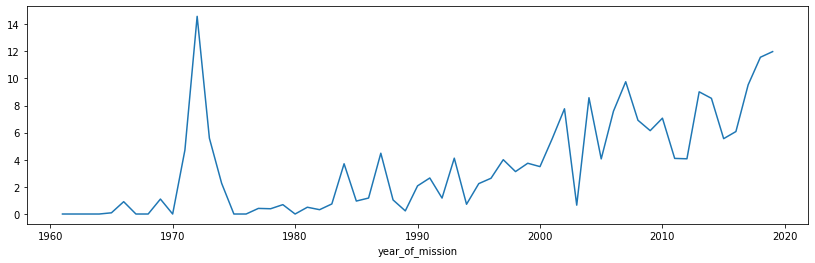

In [312]:
ax = df_astronauts.groupby(['year_of_mission'])['eva_hrs_mission'].mean().plot(kind='line', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

- Over the years the mean of EVA increases

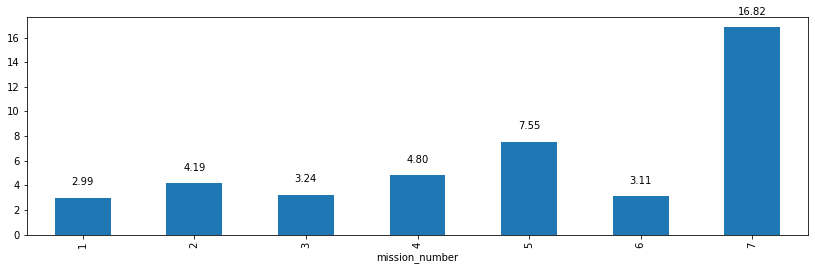

In [322]:
ax = df_astronauts.groupby(['mission_number'])['eva_hrs_mission'].mean().plot(kind='bar', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

- According to the number of mission the mean of EVA increases

Is this analysis based on EVA wrong because of different occupation??

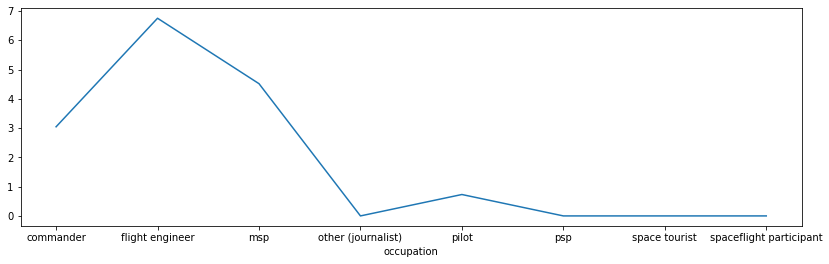

In [320]:
ax = df_astronauts.groupby(['occupation'])['eva_hrs_mission'].mean().plot(kind='line', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

- Commander, flight engineer and msp spend more EVA than the others

<AxesSubplot:>

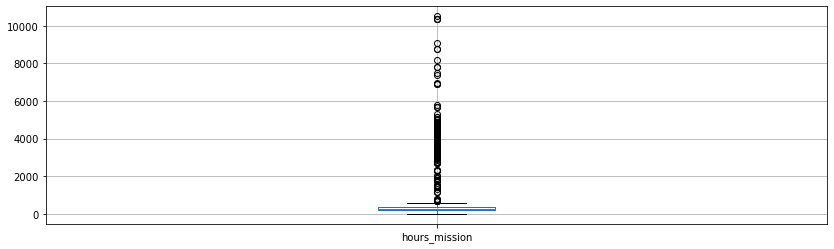

In [326]:
df_astronauts.boxplot(column=['hours_mission'], figsize=(14,4))

- Should use a Robust Scaler?

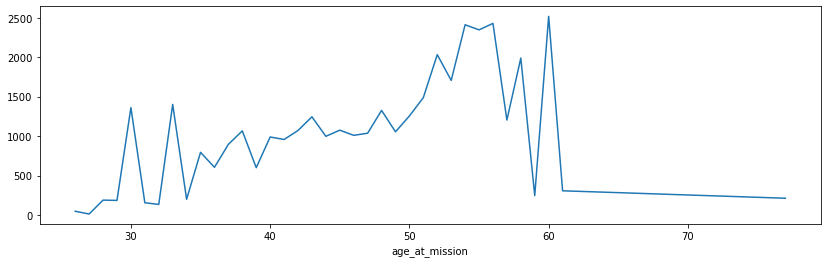

In [316]:
ax = df_astronauts.groupby(['age_at_mission'])['hours_mission'].mean().plot(kind='line', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

- Older astronauts spend more time in mission than the younger ones

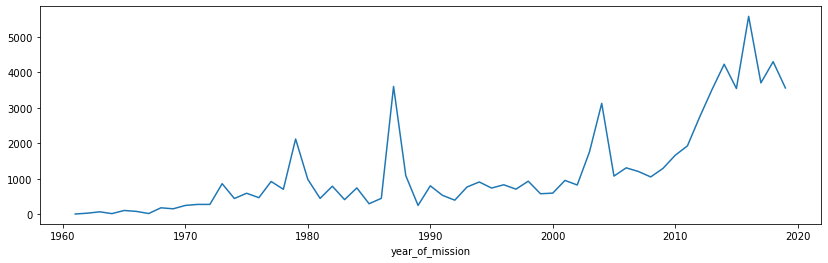

In [318]:
ax = df_astronauts.groupby(['year_of_mission'])['hours_mission'].mean().plot(kind='line', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

- In 2010 the mean of hours in mission started to increase

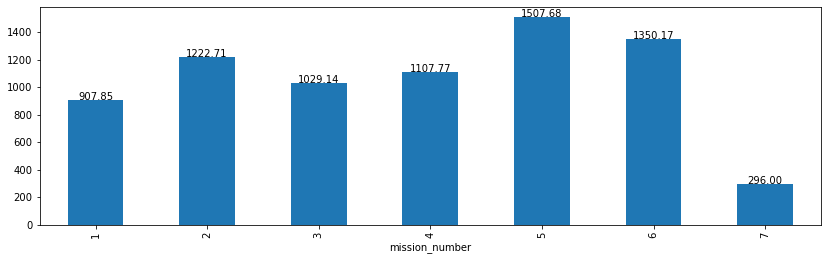

In [319]:
ax = df_astronauts.groupby(['mission_number'])['hours_mission'].mean().plot(kind='bar', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

- There are no difference in hours of mission according to the mission number

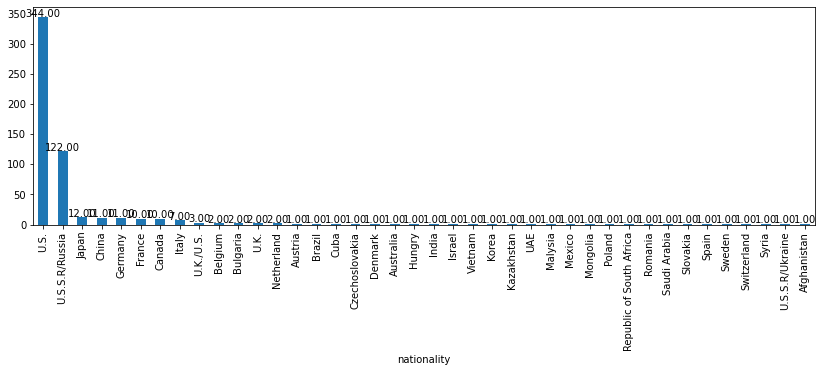

In [329]:
ax = df_astronauts.groupby(['nationality'])['name'].nunique().sort_values(ascending=False).plot(kind='bar', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

Create a new dataset (df_analysis_mission_astronauts) based on missions infos at the astronauts dataset:

In [342]:
df_analysis_mission_astronauts = df_astronauts.groupby(['mission_title'])['hours_mission'].sum().sort_values(ascending=False)

In [347]:
df_analysis_mission_astronauts = pd.DataFrame(df_analysis_mission_astronauts).reset_index()

In [348]:
df_analysis_mission_astronauts

,mission_title,hours_mission
0,Salyut 7,51277.80000
1,3,33047.00000
2,49,31149.75000
3,Salyut 6,31052.70000
4,20,29177.20000
5,24,28166.18000
6,15,27957.00000
7,22,27232.55000
8,26,25630.28000
9,23,25237.00000


In [350]:
df_analysis_mission_astronauts = pd.merge(left=df_analysis_mission_astronauts, right=df_astronauts.groupby(['mission_title'])['name'].nunique(), left_on = 'mission_title', right_on = 'mission_title')

In [352]:
df_analysis_mission_astronauts = pd.merge(left=df_analysis_mission_astronauts, right=df_astronauts.groupby(['mission_title'])['eva_hrs_mission'].sum(), left_on = 'mission_title', right_on = 'mission_title')

In [354]:
df_analysis_mission_astronauts = pd.merge(left=df_analysis_mission_astronauts, right=df_astronauts.groupby(['mission_title'])['age_at_mission'].mean(), left_on = 'mission_title', right_on = 'mission_title')

In [356]:
df_analysis_mission_astronauts = pd.merge(left=df_analysis_mission_astronauts, right=df_astronauts[df_astronauts['mission_number'] == 1].groupby(['mission_title'])['name'].count(), left_on = 'mission_title', right_on = 'mission_title')

In [358]:
for index, row in df_analysis_mission_astronauts.iterrows():
    
    df_analysis_mission_astronauts.at[index, 'pct_first_mission'] = row['name_y'] / row['name_x']

In [360]:
df_analysis_mission_astronauts = pd.merge(left=df_analysis_mission_astronauts, right=df_astronauts.groupby(['mission_title'])['time_between_selection_mission'].mean(), left_on = 'mission_title', right_on = 'mission_title')

In [362]:
df_analysis_mission_astronauts.head()

,mission_title,hours_mission,name_x,eva_hrs_mission,age_at_mission,name_y,pct_first_mission,time_between_selection_mission
0,Salyut 7,51277.80000,20,74.50000,39.87500,12,0.60000,9.08333
1,3,33047.00000,8,64.88000,41.37500,4,0.50000,12.00000
2,49,31149.75000,3,26.00000,47.66667,1,0.33333,11.66667
3,Salyut 6,31052.70000,11,13.43000,39.21429,7,0.63636,9.00000
4,20,29177.20000,8,28.83000,43.00000,5,0.62500,10.75000


In [363]:
df_analysis_mission_astronauts = df_analysis_mission_astronauts.rename(columns={'hours_mission': 'sum_hours_mission', 'name_x': 'quantity_astronauts', 'eva_hrs_mission': 'sum_eva_hrs_mission', 'age_at_mission': 'mean_age_at_mission', 'name_y': 'quantity_astronauts_at_first_mission', 'time_between_selection_mission': 'mean_time_between_selection_mission'})

In [364]:
df_analysis_mission_astronauts.head()

,mission_title,sum_hours_mission,quantity_astronauts,sum_eva_hrs_mission,mean_age_at_mission,quantity_astronauts_at_first_mission,pct_first_mission,mean_time_between_selection_mission
0,Salyut 7,51277.80000,20,74.50000,39.87500,12,0.60000,9.08333
1,3,33047.00000,8,64.88000,41.37500,4,0.50000,12.00000
2,49,31149.75000,3,26.00000,47.66667,1,0.33333,11.66667
3,Salyut 6,31052.70000,11,13.43000,39.21429,7,0.63636,9.00000
4,20,29177.20000,8,28.83000,43.00000,5,0.62500,10.75000


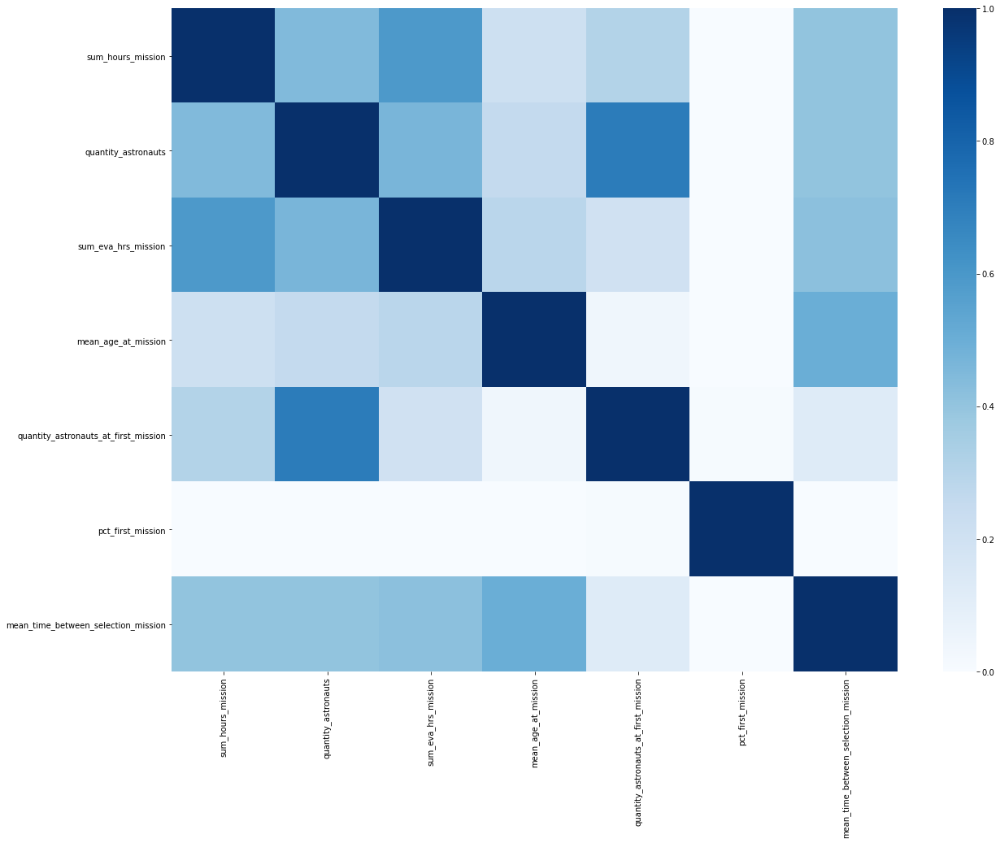

In [369]:
plt.subplots(figsize=(20,15))
sns.heatmap(df_analysis_mission_astronauts.corr(), cmap="Blues", vmin=0);

In [421]:
df_analysis_mission_astronauts.dtypes

mission_title                            object
sum_hours_mission                       float64
quantity_astronauts                       int64
sum_eva_hrs_mission                     float64
mean_age_at_mission                     float64
quantity_astronauts_at_first_mission      int64
pct_first_mission                       float64
mean_time_between_selection_mission     float64
dtype: object

In [462]:
df_analysis_mission_astronauts = df_analysis_mission_astronauts.sort_values('quantity_astronauts', ascending=False)

In [471]:
df_analysis_mission_astronauts = df_analysis_mission_astronauts[:25]

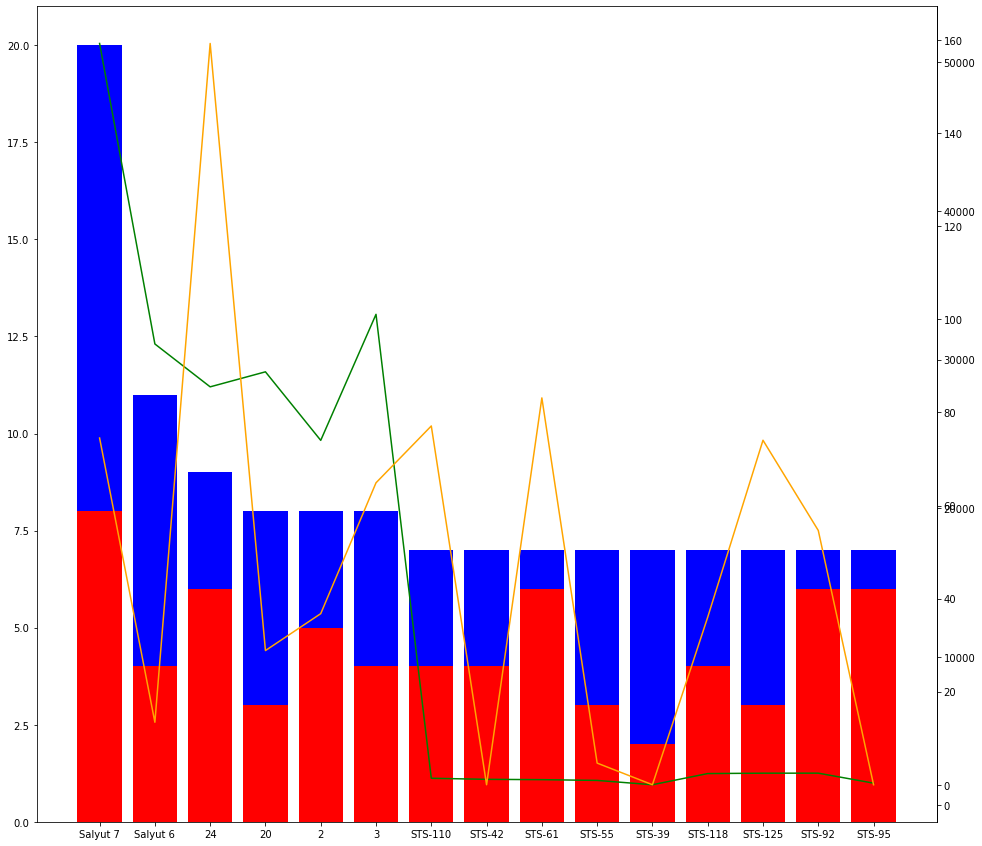

In [509]:
def make_patch_spines_invisible(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)

fig, host = plt.subplots()

fig.subplots_adjust(right=0.75)

par1 = host.twinx()
par2 = host.twinx()

make_patch_spines_invisible(par1)
make_patch_spines_invisible(par2)

par1.spines["right"].set_visible(True)
par2.spines["right"].set_visible(True)

p1 = host.bar(df_analysis_mission_astronauts['mission_title'], df_analysis_mission_astronauts['quantity_astronauts'] - df_analysis_mission_astronauts['quantity_astronauts_at_first_mission'], color='r', label='quantity_astronauts')
p2 = host.bar(df_analysis_mission_astronauts['mission_title'], df_analysis_mission_astronauts['quantity_astronauts_at_first_mission'], bottom=df_analysis_mission_astronauts['quantity_astronauts'] - df_analysis_mission_astronauts['quantity_astronauts_at_first_mission'], color='blue', label='quantity_astronauts_at_first_mission')
p3 = par1.plot(df_analysis_mission_astronauts['mission_title'], df_analysis_mission_astronauts['sum_hours_mission'], color='green', label='sum_hours_mission')
p4 = par2.plot(df_analysis_mission_astronauts['mission_title'], df_analysis_mission_astronauts['sum_eva_hrs_mission'], color='orange', label='sum_eva_hrs_mission')

fig.set_size_inches(20, 15)

- Total hours in a mission increase depending on number of astronauts
- EVA total hours in a mission don't increase depending on number of astronauts

- Build model to predict the necessary number of astronauts, mean age and mean time between selection and mission, for this specific model I would include mode variables about the astronauts and about the missions

#### df_missions

##### Data Prep

In [535]:
df_missions.head()

,Unnamed: 0,ID,Company Name,Location,Date,Detail,Status Rocket,Cost,Status Mission
0,0,0,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA","Fri Aug 07, 2020 05:12 UTC",Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,StatusActive,50.0,Success
1,1,1,CASC,"Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...","Thu Aug 06, 2020 04:01 UTC",Long March 2D | Gaofen-9 04 & Q-SAT,StatusActive,29.75,Success
2,2,2,SpaceX,"Pad A, Boca Chica, Texas, USA","Tue Aug 04, 2020 23:57 UTC",Starship Prototype | 150 Meter Hop,StatusActive,NaN,Success
3,3,3,Roscosmos,"Site 200/39, Baikonur Cosmodrome, Kazakhstan","Thu Jul 30, 2020 21:25 UTC",Proton-M/Briz-M | Ekspress-80 & Ekspress-103,StatusActive,65.0,Success
4,4,4,ULA,"SLC-41, Cape Canaveral AFS, Florida, USA","Thu Jul 30, 2020 11:50 UTC",Atlas V 541 | Perseverance,StatusActive,145.0,Success


In [536]:
df_missions['country'] = df_missions['Location'].apply(lambda x: x.split(',')[-1])

In [537]:
df_missions['country'].drop_duplicates()

0                                   USA
1                                 China
3                            Kazakhstan
9                                 Japan
13                               Israel
15                          New Zealand
28                               Russia
35            Shahrud Missile Test Site
48                               France
52                                 Iran
72                                India
91                           New Mexico
133                          Yellow Sea
461                         North Korea
481      Pacific Missile Range Facility
556                       Pacific Ocean
619                         South Korea
920                         Barents Sea
1032                             Brazil
1378                       Gran Canaria
1952                              Kenya
3302                          Australia
Name: country, dtype: object

In [538]:
df_missions['country'] = df_missions['country'].apply(lambda x: x.strip().replace('New Mexico', 'USA'))
df_missions['country'] = df_missions['country'].apply(lambda x: x.strip().replace('Yellow Sea', 'China'))
df_missions['country'] = df_missions['country'].apply(lambda x: x.strip().replace('Shahrud Missile Test Site', 'Iran'))
df_missions['country'] = df_missions['country'].apply(lambda x: x.strip().replace('Pacific Missile Range Facility', 'USA'))
df_missions['country'] = df_missions['country'].apply(lambda x: x.strip().replace('Barents Sea', 'Russia'))
df_missions['country'] = df_missions['country'].apply(lambda x: x.strip().replace('Gran Canaria', 'USA'))

In [539]:
df_missions['country'].drop_duplicates()

0                 USA
1               China
3          Kazakhstan
9               Japan
13             Israel
15        New Zealand
28             Russia
35               Iran
48             France
72              India
461       North Korea
556     Pacific Ocean
619       South Korea
1032           Brazil
1952            Kenya
3302        Australia
Name: country, dtype: object

In [540]:
df_missions['Date'] = pd.to_datetime(df_missions['Date'])

In [541]:
df_missions['year_mission'] = df_missions['Date'].apply(lambda x: x.year)
df_missions['month_mission'] = df_missions['Date'].apply(lambda x: x.month)

In [563]:
df_missions.isnull().sum()

Unnamed: 0           0
ID                   0
Company Name         0
Location             0
Date                 0
Detail               0
Status Rocket        0
 Cost             3360
Status Mission       0
country              0
year_mission         0
month_mission        0
dtype: int64

In [564]:
df_missions.count()

Unnamed: 0        4324
ID                4324
Company Name      4324
Location          4324
Date              4324
Detail            4324
Status Rocket     4324
 Cost              964
Status Mission    4324
country           4324
year_mission      4324
month_mission     4324
dtype: int64

In [567]:
df_missions[' Cost'] = df_missions[' Cost'].fillna(0)

In [568]:
df_missions = df_missions.rename(columns={' Cost': 'Cost'})

In [569]:
df_missions.dtypes

Unnamed: 0         int64
ID                 int64
Company Name      object
Location          object
Date              object
Detail            object
Status Rocket     object
Cost              object
Status Mission    object
country           object
year_mission       int64
month_mission      int64
dtype: object

In [542]:
df_missions.head()

,Unnamed: 0,ID,Company Name,Location,Date,Detail,Status Rocket,Cost,Status Mission,country,year_mission,month_mission
0,0,0,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA",2020-08-07 05:12:00+00:00,Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,StatusActive,50.0,Success,USA,2020,8
1,1,1,CASC,"Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...",2020-08-06 04:01:00+00:00,Long March 2D | Gaofen-9 04 & Q-SAT,StatusActive,29.75,Success,China,2020,8
2,2,2,SpaceX,"Pad A, Boca Chica, Texas, USA",2020-08-04 23:57:00+00:00,Starship Prototype | 150 Meter Hop,StatusActive,NaN,Success,USA,2020,8
3,3,3,Roscosmos,"Site 200/39, Baikonur Cosmodrome, Kazakhstan",2020-07-30 21:25:00+00:00,Proton-M/Briz-M | Ekspress-80 & Ekspress-103,StatusActive,65.0,Success,Kazakhstan,2020,7
4,4,4,ULA,"SLC-41, Cape Canaveral AFS, Florida, USA",2020-07-30 11:50:00+00:00,Atlas V 541 | Perseverance,StatusActive,145.0,Success,USA,2020,7


##### Analysis

In [747]:
df_missions.head()

,Unnamed: 0,ID,Company Name,Location,Date,Detail,Status Rocket,Cost,Status Mission,country,year_mission,month_mission
0,0,0,SpaceX,"LC-39A, Kennedy Space Center, Florida, USA",2020-08-07 05:12:00+00:00,Falcon 9 Block 5 | Starlink V1 L9 & BlackSky,StatusActive,50.0,Success,USA,2020,8
1,1,1,CASC,"Site 9401 (SLS-2), Jiuquan Satellite Launch Ce...",2020-08-06 04:01:00+00:00,Long March 2D | Gaofen-9 04 & Q-SAT,StatusActive,29.75,Success,China,2020,8
2,2,2,SpaceX,"Pad A, Boca Chica, Texas, USA",2020-08-04 23:57:00+00:00,Starship Prototype | 150 Meter Hop,StatusActive,0,Success,USA,2020,8
3,3,3,Roscosmos,"Site 200/39, Baikonur Cosmodrome, Kazakhstan",2020-07-30 21:25:00+00:00,Proton-M/Briz-M | Ekspress-80 & Ekspress-103,StatusActive,65.0,Success,Kazakhstan,2020,7
4,4,4,ULA,"SLC-41, Cape Canaveral AFS, Florida, USA",2020-07-30 11:50:00+00:00,Atlas V 541 | Perseverance,StatusActive,145.0,Success,USA,2020,7


In [748]:
matrix_df = pps.matrix(df_missions)[['x', 'y', 'ppscore']].pivot(columns='x', index='y', values='ppscore')

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=4.

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=4.

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=4.

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning:

The least populated class in y has only 3 members, which is less than n_splits=4.

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=4.



<AxesSubplot:xlabel='x', ylabel='y'>

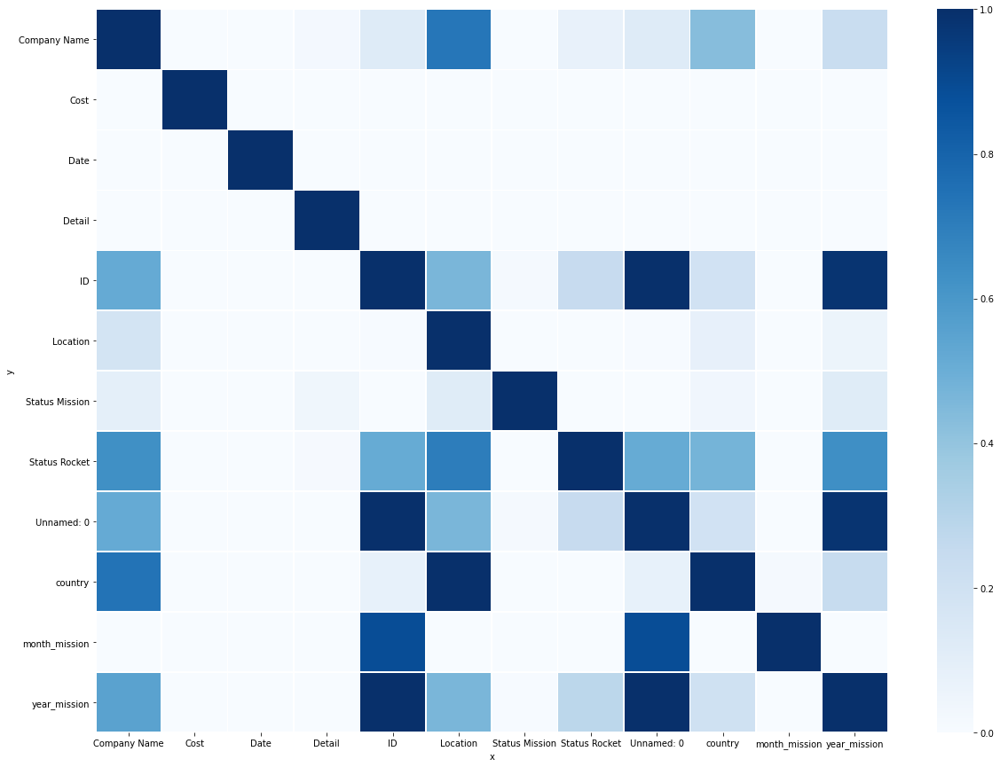

In [749]:
plt.subplots(figsize=(20,15))
sns.heatmap(matrix_df, vmin=0, vmax=1, cmap="Blues", linewidths=.5)

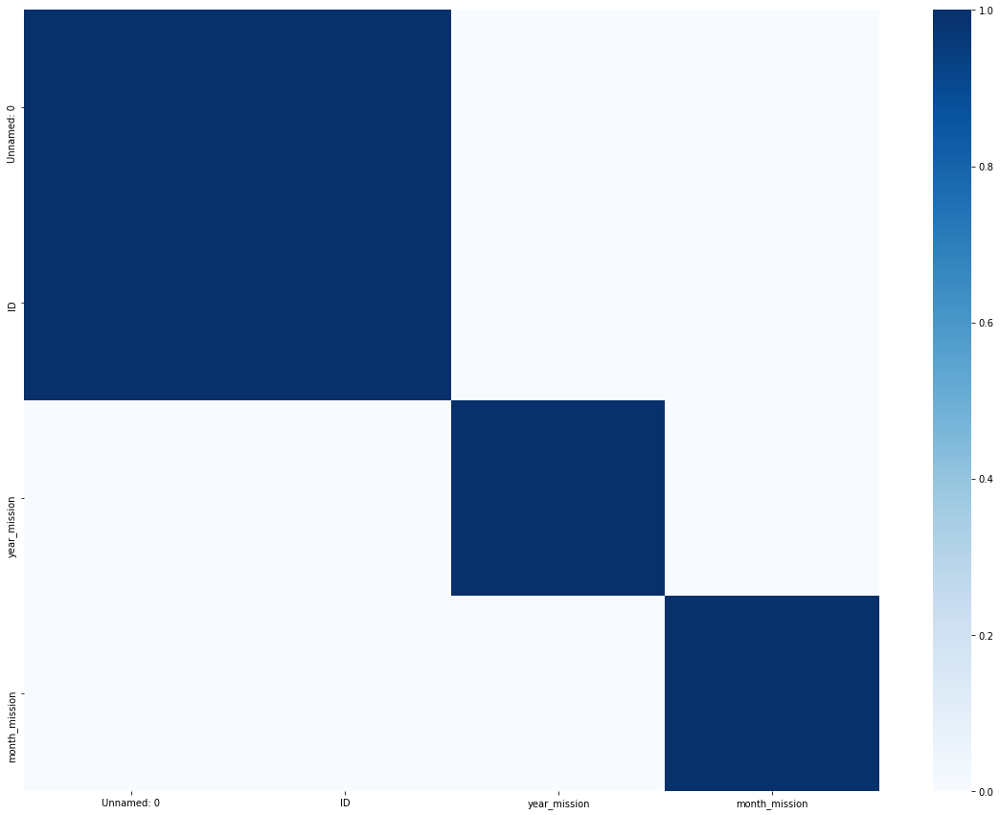

In [750]:
plt.subplots(figsize=(20,15))
sns.heatmap(df_missions.corr(), cmap="Blues", vmin=0);

Further analysis will be based on first impressions from PPScore and Correlation heatmap

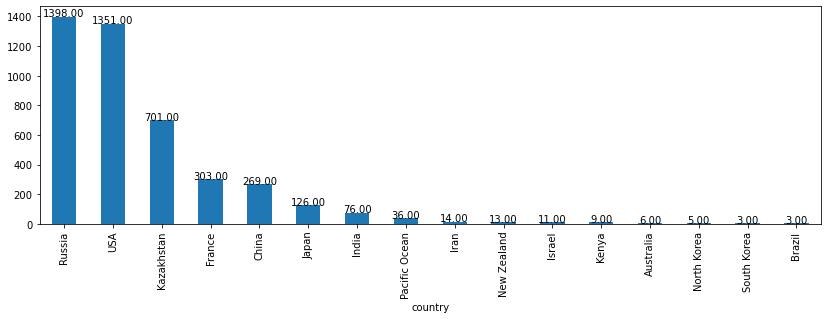

In [752]:
ax = df_missions.groupby(['country'])['Status Rocket'].count().sort_values(ascending=False).plot(kind='bar', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

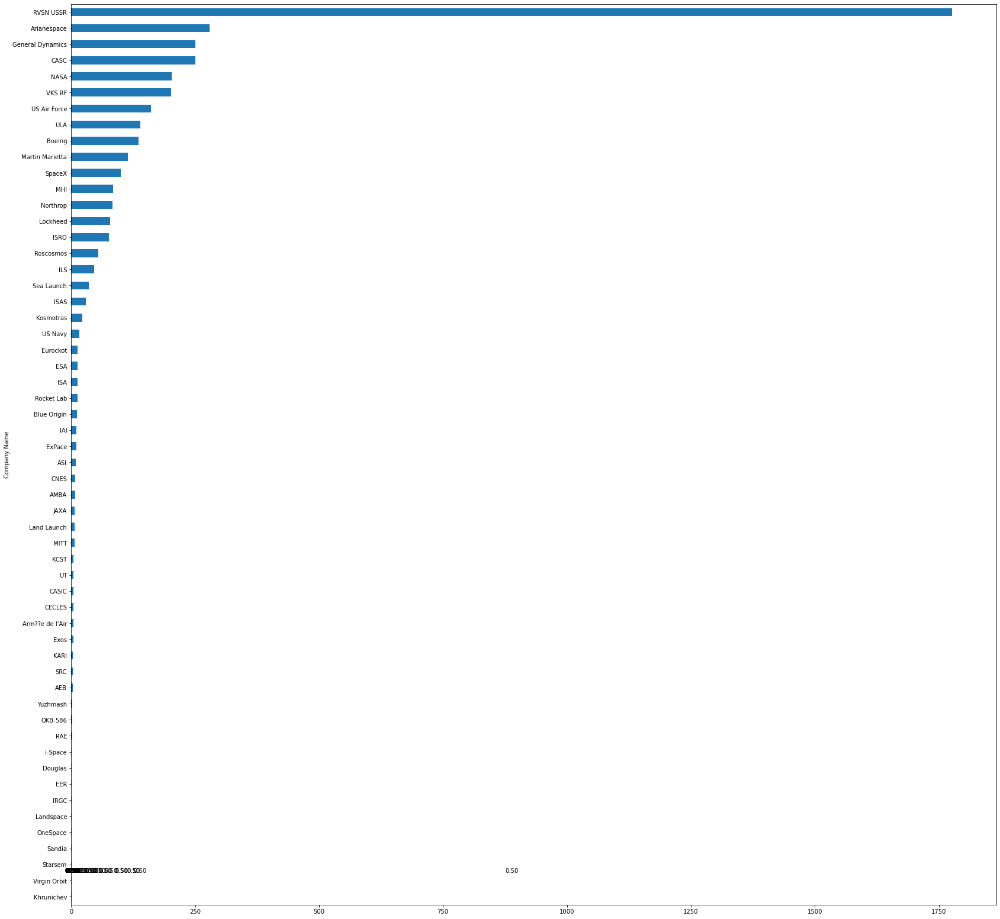

In [551]:
ax = df_missions.groupby(['Company Name'])['ID'].count().sort_values(ascending=True).plot(kind='barh', figsize=(28,28))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

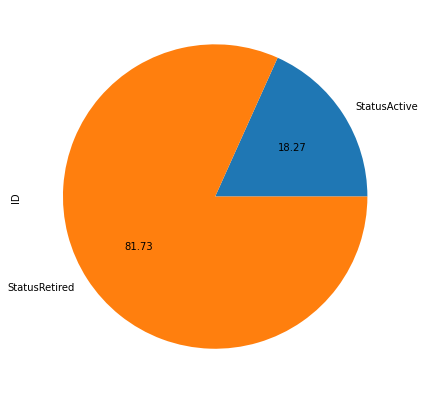

In [561]:
ax = df_missions.groupby(['Status Rocket'])['ID'].count().sort_values(ascending=True).plot(kind='pie', figsize=(7,7), autopct='%.2f')

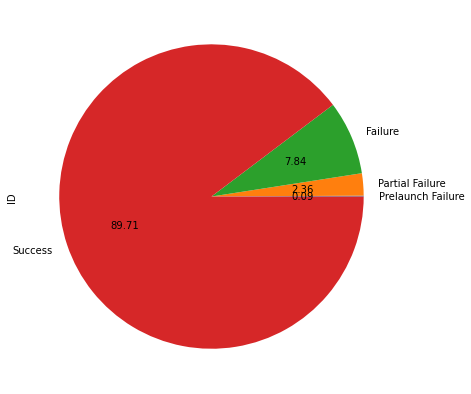

In [562]:
ax = df_missions.groupby(['Status Mission'])['ID'].count().sort_values(ascending=True).plot(kind='pie', figsize=(7,7), autopct='%.2f')

Create a new dataset (df_analysis_missions) based on missions infos by year:

In [671]:
df_analysis_missions = df_missions.groupby(['year_mission'])['ID'].count().sort_values(ascending=False).reset_index(name ='total_missions')

In [672]:
df_analysis_missions = pd.DataFrame(df_analysis_missions)

In [673]:
df_analysis_missions = pd.merge(left=df_analysis_missions, right=df_missions.groupby(['year_mission'])['Company Name'].nunique().reset_index(name ='total_companies'), left_on = 'year_mission', right_on = 'year_mission')

In [674]:
df_analysis_missions = pd.merge(left=df_analysis_missions, right=df_missions[df_missions['Status Mission'] == 'Success'].groupby(['year_mission'])['ID'].count().reset_index(name ='mission_success'), left_on = 'year_mission', right_on = 'year_mission')

In [675]:
df_analysis_missions = pd.merge(left=df_analysis_missions, right=df_missions[df_missions['Status Rocket'] == 'StatusActive'].groupby(['year_mission'])['ID'].count().reset_index(name ='rocket_active'), left_on = 'year_mission', right_on = 'year_mission')

In [676]:
df_analysis_missions = pd.merge(left=df_analysis_missions, right=df_missions[df_missions['Status Rocket'] == 'StatusRetired'].groupby(['year_mission'])['ID'].count().reset_index(name ='rocket_retired'), left_on = 'year_mission', right_on = 'year_mission')

In [677]:
df_analysis_missions.head()

,year_mission,total_missions,total_companies,mission_success,rocket_active,rocket_retired
0,2018,117,16,113,93,24
1,2019,109,18,100,100,9
2,2017,92,18,84,64,28
3,2016,90,15,86,66,24
4,1990,80,12,76,1,79


In [678]:
df_analysis_missions = df_analysis_missions.sort_values(by=['year_mission'], ascending=True)

In [680]:
for index, row in df_analysis_missions.iterrows():
    
    df_analysis_missions.at[index, 'total_rocket'] = row['rocket_retired'] + row['rocket_active']
    
    df_analysis_missions.at[index, 'mission_fail'] = row['total_missions'] - row['mission_success']
    

In [681]:
df_analysis_missions.head()

,year_mission,total_missions,total_companies,mission_success,rocket_active,rocket_retired,total_rocket,mission_fail
9,1982,67,8,62,1,66,67.00000,5.00000
10,1983,66,10,65,1,65,66.00000,1.00000
7,1984,69,10,66,1,68,69.00000,3.00000
5,1985,74,7,68,1,73,74.00000,6.00000
14,1986,62,7,56,1,61,62.00000,6.00000


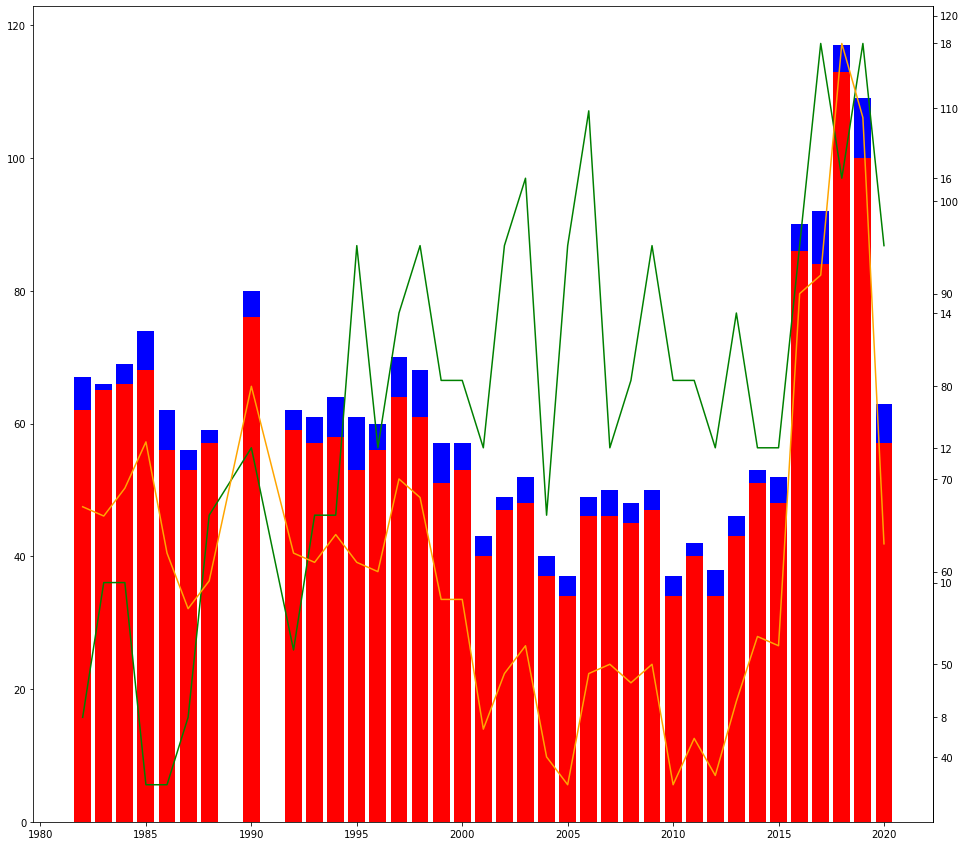

In [682]:
def make_patch_spines_invisible(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)

fig, host = plt.subplots()

fig.subplots_adjust(right=0.75)

par1 = host.twinx()
par2 = host.twinx()

make_patch_spines_invisible(par1)
make_patch_spines_invisible(par2)

par1.spines["right"].set_visible(True)
par2.spines["right"].set_visible(True)

p1 = host.bar(df_analysis_missions['year_mission'], df_analysis_missions['mission_success'], color='r', label='mission_success')
p2 = host.bar(df_analysis_missions['year_mission'], df_analysis_missions['mission_fail'], bottom=df_analysis_missions['mission_success'] , color='blue', label='mission_fail')
p3 = par1.plot(df_analysis_missions['year_mission'], df_analysis_missions['total_companies'], color='green', label='total_companies')
p4 = par2.plot(df_analysis_missions['year_mission'], df_analysis_missions['total_rocket'], color='orange', label='total_rocket')

fig.set_size_inches(20, 15)


- When the number of rockets increase the number of missions increase, it means that the rockets are used in their maximum potential
- The number of companies increase but the number of the missions don't, it means that we have like "inactive companies"
- Number of missions increase with the increase of number of companies

In [730]:
df_mission_analysis_aux = df_missions[df_missions['Status Mission'] == 'Success'].groupby(['year_mission','Company Name'])['ID'].count().reset_index(name='launches').sort_values(['year_mission', 'launches'], ascending=False)

In [731]:
df_mission_analysis_aux = pd.concat([group[1].head(1) for group in df_mission_analysis_aux.groupby(['year_mission'])])

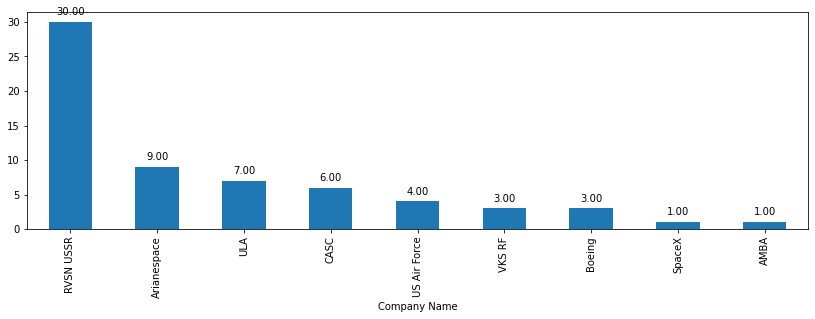

In [732]:
ax = df_mission_analysis_aux.groupby(['Company Name'])['year_mission'].count().sort_values(ascending=False).plot(kind='bar', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

In [733]:
fig = px.bar(
    df_mission_analysis_aux, 
    x="year_mission", 
    y="launches", 
    color='Company Name',
    width=800
)

fig.show()

- This analysis show us that the company RVSN was the company with most successful launches in 30 years 

In [734]:
df_mission_analysis_aux = df_missions[df_missions['Status Mission'] == 'Success'].groupby(['year_mission','country'])['ID'].count().reset_index(name='launches').sort_values(['year_mission', 'launches'], ascending=False)

In [735]:
df_mission_analysis_aux = pd.concat([group[1].head(1) for group in df_mission_analysis_aux.groupby(['year_mission'])])

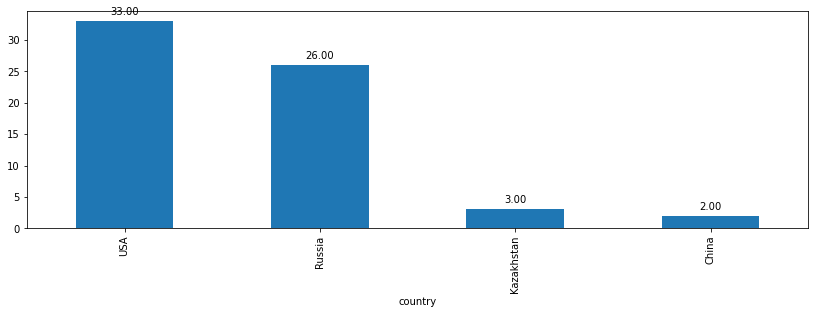

In [736]:
ax = df_mission_analysis_aux.groupby(['country'])['year_mission'].count().sort_values(ascending=False).plot(kind='bar', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

In [737]:
fig = px.bar(
    df_mission_analysis_aux, 
    x="year_mission", 
    y="launches", 
    color='country',
    width=800
)

fig.show()

- This analysis show us that the USA was the company with most successful launches in 33 years 

In [738]:
df_mission_analysis_aux = df_missions[df_missions['Status Mission'] != 'Success'].groupby(['year_mission','Company Name'])['ID'].count().reset_index(name='launches').sort_values(['year_mission', 'launches'], ascending=False)

In [739]:
df_mission_analysis_aux = pd.concat([group[1].head(1) for group in df_mission_analysis_aux.groupby(['year_mission'])])

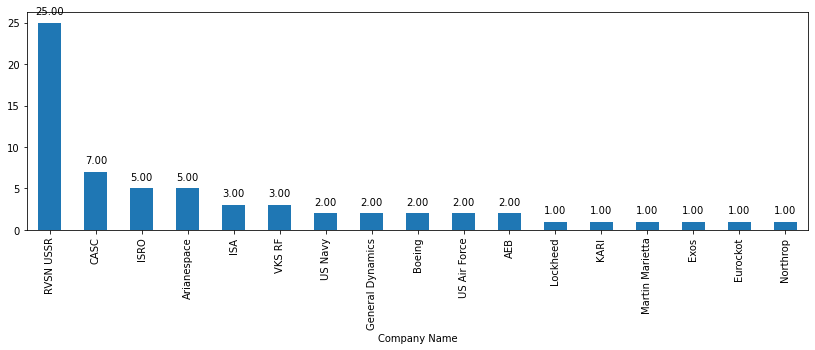

In [740]:
ax = df_mission_analysis_aux.groupby(['Company Name'])['year_mission'].count().sort_values(ascending=False).plot(kind='bar', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

In [741]:
fig = px.bar(
    df_mission_analysis_aux, 
    x="year_mission", 
    y="launches", 
    color='Company Name',
    width=800
)

fig.show()

- This analysis show us that the company RVSN was the company with most failures launches in 25 years 

In [742]:
df_mission_analysis_aux = df_missions[df_missions['Status Mission'] != 'Success'].groupby(['year_mission','country'])['ID'].count().reset_index(name='launches').sort_values(['year_mission', 'launches'], ascending=False)

In [743]:
df_mission_analysis_aux = pd.concat([group[1].head(1) for group in df_mission_analysis_aux.groupby(['year_mission'])])

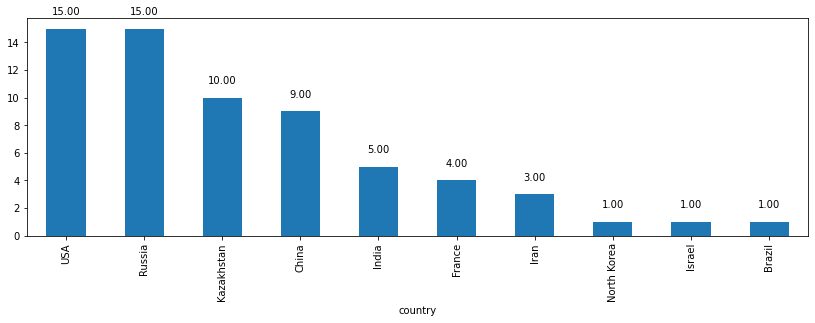

In [744]:
ax = df_mission_analysis_aux.groupby(['country'])['year_mission'].count().sort_values(ascending=False).plot(kind='bar', figsize=(14,4))

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,height + 1, '{:1.2f}'.format(height), ha='center')

In [745]:
fig = px.bar(
    df_mission_analysis_aux, 
    x="year_mission", 
    y="launches", 
    color='country',
    width=800
)

fig.show()

- This analysis show us that the USA and Russia was the company with most successful launches in 33 years 

- This analysis comparing leaders of successful launches show us that success missions are correlated with fail missions, maybe you will fail a lot before you get success

<br>
Create a model to forecast the number of success missions, failures and total number of missions for each company/country, in this part we could use the model to predict the cost, but as the cost feature is with data quality problems i will not use it (in the data prep we should build a model (KNN) to treat the missing values))

I choosed ARIMA with Autoregressive Moving Average because the method is suitable for univariate time series without trend and seasonal components. (https://machinelearningmastery.com/time-series-forecasting-methods-in-python-cheat-sheet/)

In [791]:
from statsmodels.tsa.arima.model import ARIMA
import statsmodels

I'm selecting data from SpaceX, I tryied to use data from RVSN but they stopped their missions before 2000.

#### Data prep

In [780]:
df_missions_forecast_model = df_missions.groupby(['year_mission','Company Name'])['ID'].count().reset_index(name='launches').sort_values(['year_mission', 'launches'], ascending=False)

In [781]:
df_missions_forecast_model.head()

,year_mission,Company Name,launches
649,2020,CASC,19
659,2020,SpaceX,14
648,2020,Arianespace,4
658,2020,Roscosmos,4
660,2020,ULA,4


In [782]:
df_missions_forecast_model['Company Name'].drop_duplicates()

649                CASC
659              SpaceX
648         Arianespace
658           Roscosmos
660                 ULA
650              ExPace
657          Rocket Lab
661              VKS RF
655                 MHI
656            Northrop
651                 IAI
652                IRGC
653                 ISA
654                JAXA
662        Virgin Orbit
637                ISRO
631         Blue Origin
634                Exos
635                 ILS
641            OneSpace
647             i-Space
617            Eurockot
622           Landspace
599               CASIC
606         Land Launch
589                KCST
574           Kosmotras
577              Sandia
561          Khrunichev
565          Sea Launch
548                KARI
533                 ESA
525                NASA
449              Boeing
453                ISAS
457                MITT
460                 SRC
441            Lockheed
406                 AEB
420             Starsem
350           RVSN USSR
300             

In [783]:
df_missions_forecast_model = df_missions_forecast_model[df_missions_forecast_model['Company Name'] == 'SpaceX']

In [784]:
df_missions_forecast_model.head()

,year_mission,Company Name,launches
659,2020,SpaceX,14
644,2019,SpaceX,13
627,2018,SpaceX,21
611,2017,SpaceX,18
593,2016,SpaceX,9


In [806]:
model = ARIMA(df_missions_forecast_model['launches'], order=(2,0,1))

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

/Users/gabrielasimoes/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



In [807]:
model_fit = model.fit()

In [808]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:               launches   No. Observations:                   14
Model:                 ARIMA(2, 0, 1)   Log Likelihood                 -36.472
Date:                Tue, 02 Feb 2021   AIC                             82.944
Time:                        00:11:01   BIC                             86.140
Sample:                             0   HQIC                            82.648
                                 - 14                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.9127      5.934      1.333      0.182      -3.719      19.544
ar.L1          0.4932      0.413      1.194      0.233      -0.317       1.303
ar.L2          0.2130      0.422      0.505      0.614      -0.615       1.041
ma.L1          0.9998    633.847      0.002      0.999   -1241.318    1243.317
sigma2         8.1831   5184.762      0.002      0.999   -1.02e+04    1.02e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.36   Jarque-Bera (JB):                13.68
Prob(Q):                              0.55   Prob(JB):                         0.00
Heteroskedasticity (H):               0.10   Skew:                             1.79
Prob(H) (two-sided):                  0.02   Kurtosis:                         6.25
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [801]:
predict = model_fit.predict()

In [802]:
predict

659    7.91266
644   13.10605
627   11.64943
611   22.40171
593   12.17390
578    7.96257
566    6.87118
554    6.01398
540    2.40690
515    3.58387
502    2.29810
487    2.05438
474    3.47339
462    0.94798
Name: predicted_mean, dtype: float64